# <font color="yellow"> Machine Learning and Deep Learning [KAN-CDSCO2004U] </font>
#### **Students & Student Number:** Adrian, Helen, David Hark, Anna

In [1]:
# only for colab
!pip install imagehash

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 2.5 MB/s eta 0:00:00


In [2]:
# import relevant libraries
import os as os
import numpy as np
from PIL import Image
import seaborn as sns; sns.set()
from collections import defaultdict
from imagehash import phash
import matplotlib.pyplot as plt
import cv2


## <font color="yellow"> Loading Data</font>
Data set source: https://www.kaggle.com/datasets/bhaveshmittal/melanoma-cancer-dataset/data (path: '/kaggle/input/melanoma-cancer-dataset')

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
# Load images from drive (color correction from BGR to RGB)
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        # Full path to the image
        img_path = os.path.join(folder, filename)
        # Load the image in BGR format
        img = cv2.imread(img_path)
        if img is not None:
            # Convert the image from BGR to RGB
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img_rgb)
    return images

# Update Data directories with full path after drive mount
base_path = '/content/drive/MyDrive/Final Project ML/'  # Update base path if necessary

# Define directories for malignant and benign data in training and testing sets
mal_train_dir = os.path.join(base_path, 'Data/Train/Malignant')
mal_test_dir = os.path.join(base_path, 'Data/Test/Malignant')
ben_train_dir = os.path.join(base_path, 'Data/Train/Benign')
ben_test_dir = os.path.join(base_path, 'Data/Test/Benign')

# Load and convert images from each directory
mal_train_img = load_images_from_folder(mal_train_dir)
mal_test_img = load_images_from_folder(mal_test_dir)
ben_train_img = load_images_from_folder(ben_train_dir)
ben_test_img = load_images_from_folder(ben_test_dir)

## <font color="yellow"> Exploratory Data Analysis</font>

1. Number of images in each data set

In [6]:
# Malignant images
num_mal_train_img = len(mal_train_img)
num_mal_test_img = len(mal_test_img)
print("Number of malignant images (train):", num_mal_train_img)
print("Number of malignant images (test):", num_mal_test_img)

# Benign images
num_ben_train_img = len(ben_train_img)
num_ben_test_img = len(ben_test_img)
print("\nNumber of benign images (train):", num_ben_train_img)
print("Number of benign images (test):", num_ben_test_img)

Number of malignant images (train): 5630
Number of malignant images (test): 1000

Number of benign images (train): 6299
Number of benign images (test): 1000


2. Height and width of the images in pixels as well as the number of color channels

In [7]:
# Print shapes of the first 5 malignant train images
print("Shapes of the first 5 malignant train images:")
for img in mal_train_img[:5]:
    print("Shape of malignant train image:", img.shape)

# Print shapes of the first 5 malignant test images
print("\nShapes of the first 5 malignant test images:")
for img in mal_test_img[:5]:
    print("Shape of malignant test image:", img.shape)

# Print shapes of the first 5 benign train images
print("\nShapes of the first 5 benign train images:")
for img in ben_train_img[:5]:
    print("Shape of benign train image:", img.shape)

# Print shapes of the first 5 benign test images
print("\nShapes of the first 5 benign test images:")
for img in ben_test_img[:5]:
    print("Shape of benign test image:", img.shape)

Shapes of the first 5 malignant train images:
Shape of malignant train image: (224, 224, 3)
Shape of malignant train image: (224, 224, 3)
Shape of malignant train image: (224, 224, 3)
Shape of malignant train image: (224, 224, 3)
Shape of malignant train image: (224, 224, 3)

Shapes of the first 5 malignant test images:
Shape of malignant test image: (224, 224, 3)
Shape of malignant test image: (224, 224, 3)
Shape of malignant test image: (224, 224, 3)
Shape of malignant test image: (224, 224, 3)
Shape of malignant test image: (224, 224, 3)

Shapes of the first 5 benign train images:
Shape of benign train image: (224, 224, 3)
Shape of benign train image: (224, 224, 3)
Shape of benign train image: (224, 224, 3)
Shape of benign train image: (224, 224, 3)
Shape of benign train image: (224, 224, 3)

Shapes of the first 5 benign test images:
Shape of benign test image: (224, 224, 3)
Shape of benign test image: (224, 224, 3)
Shape of benign test image: (224, 224, 3)
Shape of benign test imag

3. Since the first five values are the same, check wether all of the images are in the same format

In [8]:
# Check if all malignant train images have the shape (224, 224, 3)
mal_train_shape = all(img.shape == (224, 224, 3) for img in mal_train_img)
print("Are all malignant images of shape (224, 224, 3)?\n", mal_train_shape)

# Check if all malignant test images have the shape (224, 224, 3)
mal_test_shape = all(img.shape == (224, 224, 3) for img in mal_test_img)
print("\nAre all malignant images of shape (224, 224, 3)?\n", mal_test_shape)

# Check if all benign train images have the shape (224, 224, 3)
ben_train_shape = all(img.shape == (224, 224, 3) for img in ben_train_img)
print("\nAre all benign images of shape (224, 224, 3)?\n", ben_train_shape)

# Check if all benign test images have the shape (224, 224, 3)
ben_test_shape = all(img.shape == (224, 224, 3) for img in ben_test_img)
print("\nAre all benign images of shape (224, 224, 3)?\n", ben_test_shape)

Are all malignant images of shape (224, 224, 3)?
 True

Are all malignant images of shape (224, 224, 3)?
 True

Are all benign images of shape (224, 224, 3)?
 True

Are all benign images of shape (224, 224, 3)?
 True


4. Printing some pictures to have a look at them

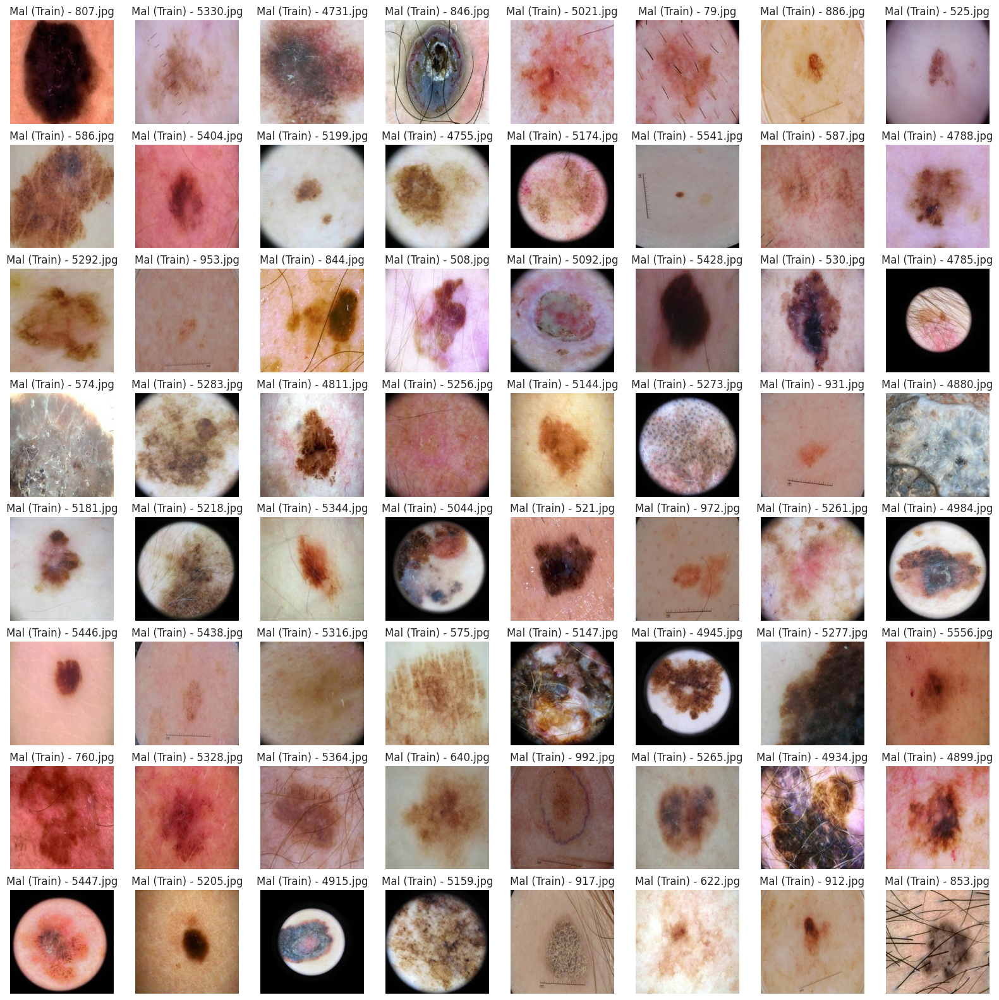

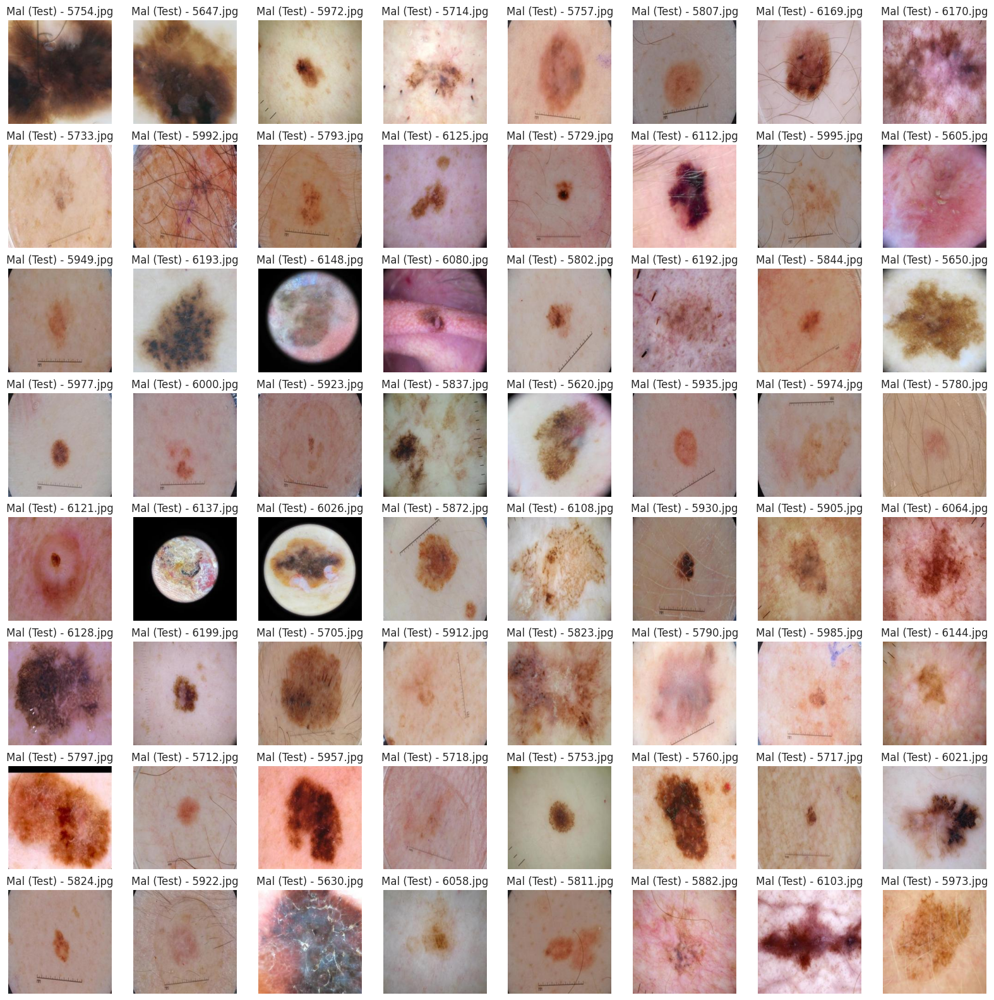

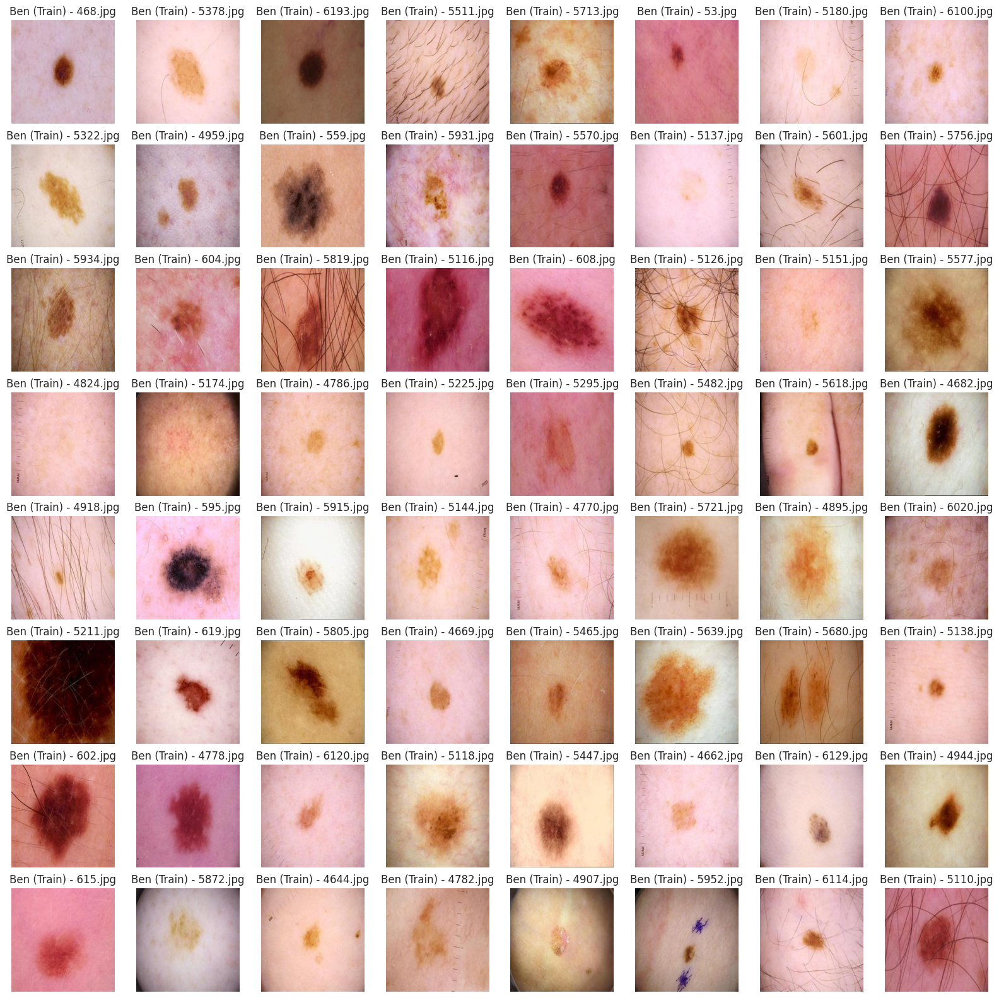

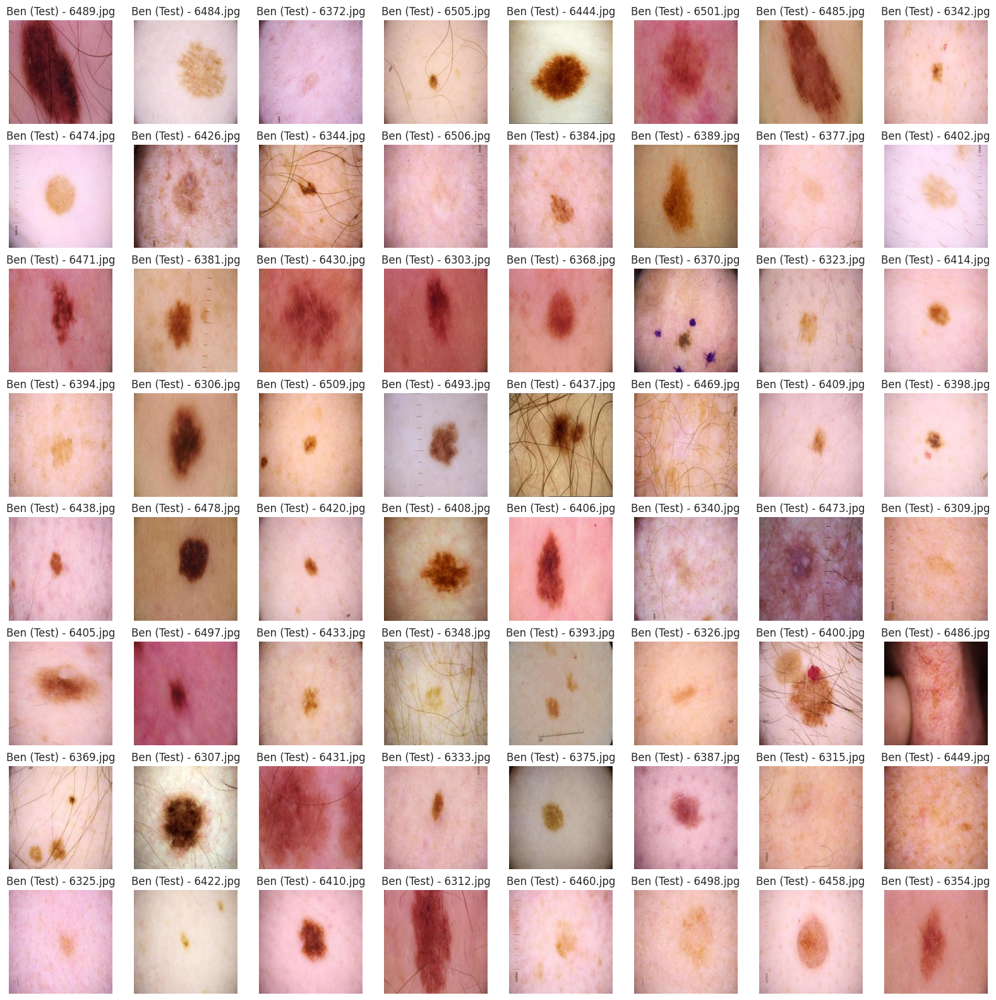

In [9]:
#Extract the filenames of the malignant and benign images
mal_train_filenames = [os.path.basename(file) for file in os.listdir(mal_train_dir)]
mal_test_filenames = [os.path.basename(file) for file in os.listdir(mal_test_dir)]
ben_train_filenames = [os.path.basename(file) for file in os.listdir(ben_train_dir)]
ben_test_filenames = [os.path.basename(file) for file in os.listdir(ben_test_dir)]

# Display the first 64 malignant train images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(mal_train_img[i])
    plt.title(f"Mal (Train) - {mal_train_filenames[i]}")
    plt.axis('off')
plt.show()

# Display the first 64 malignant test images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(mal_test_img[i])
    plt.title(f"Mal (Test) - {mal_test_filenames[i]}")
    plt.axis('off')
plt.show()

# Display the first 64 benign train images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(ben_train_img[i])
    plt.title(f"Ben (Train) - {ben_train_filenames[i]}")
    plt.axis('off')
plt.show()

# Display the first 64 benign test images
plt.figure(figsize=(20, 20))
for i in range(64):
    plt.subplot(8, 8, i+1)
    plt.imshow(ben_test_img[i])
    plt.title(f"Ben (Test) - {ben_test_filenames[i]}")
    plt.axis('off')
plt.show()

5. Looking at statistical values

In [10]:
for category, images in zip(["Malignant Train", "Malignant Test", "Benign Train", "Benign Test"], [mal_train_img, mal_test_img, ben_train_img, ben_test_img]):
    pixel_values = np.concatenate([img.flatten() for img in images])
    print(f"\nStatistics for {category} images:")
    print("Mean pixel value:", np.mean(pixel_values))
    print("Median pixel value:", np.median(pixel_values))
    print("Standard deviation of pixel values:", np.std(pixel_values))


Statistics for Malignant Train images:
Mean pixel value: 138.651998961288
Median pixel value: 151.0
Standard deviation of pixel values: 61.61182260217087

Statistics for Malignant Test images:
Mean pixel value: 148.16792845849278
Median pixel value: 156.0
Standard deviation of pixel values: 52.30019440648907

Statistics for Benign Train images:
Mean pixel value: 168.5116226855433
Median pixel value: 174.0
Standard deviation of pixel values: 50.81727314406056

Statistics for Benign Test images:
Mean pixel value: 173.8102100406569
Median pixel value: 182.0
Standard deviation of pixel values: 50.12860119523958


## <font color="yellow"> Data Preprocessing</font>

### <font color="yellow"> 1. Delete Duplicates </font>

1.1 Check whether there are duplicates

Number of duplicates in malignant train images: 377
First duplicate pair in the dataset


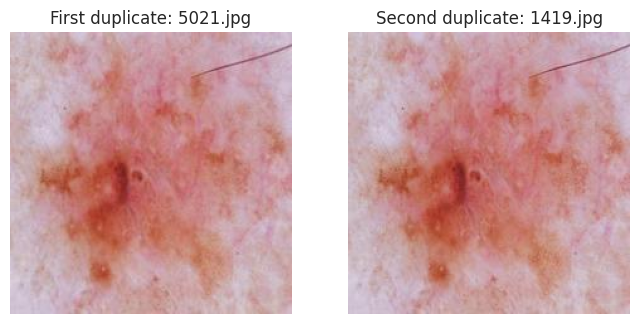

Number of duplicates in malignant test images: 2
First duplicate pair in the dataset


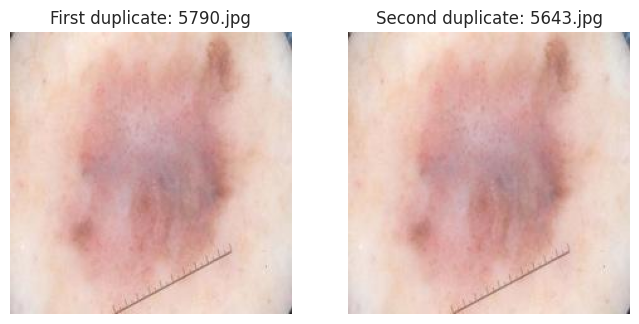

Number of duplicates in benign train images: 10
First duplicate pair in the dataset


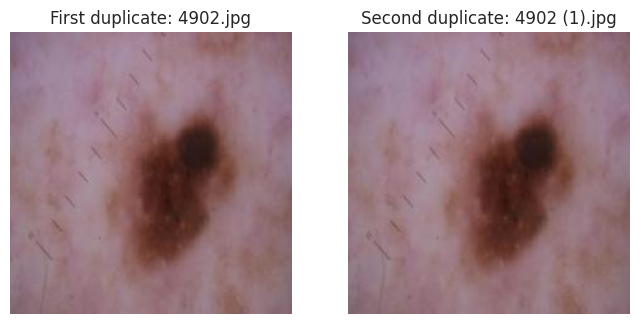

Number of duplicates in bening test images: 0


In [5]:
def find_first_duplicate_in_dataset(images, folder, dataset_name):
    filenames = os.listdir(folder)
    hash_to_image = defaultdict(list)
    for i, (image, filename) in enumerate(zip(images, filenames)):
        hash_value = phash(Image.fromarray(image))
        hash_to_image[hash_value].append((i, filename))

    num_duplicates = 0
    for hash_value, indexes in hash_to_image.items():
        if len(indexes) > 1:
            num_duplicates += 1

    print(f"Number of duplicates in {dataset_name}: {num_duplicates}")

    for hash_value, indexes in hash_to_image.items():
        if len(indexes) > 1:
            first_duplicate_index, first_duplicate_filename = indexes[0]
            second_duplicate_index, second_duplicate_filename = indexes[1]

            # display the first duplicate image
            plt.figure(figsize=(8, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(images[first_duplicate_index])
            print(f"First duplicate pair in the dataset")
            plt.title(f"First duplicate: {first_duplicate_filename}")
            plt.axis('off')

            # display the second duplicate image
            plt.subplot(1, 2, 2)
            plt.imshow(images[second_duplicate_index])
            plt.title(f"Second duplicate: {second_duplicate_filename}")
            plt.axis('off')

            plt.show()
            break  # stop after displaying the first pair of duplicates
    return None, None, None, None

first_malignant_duplicate, second_malignant_duplicate, malignant_first_filename, malignant_second_filename = find_first_duplicate_in_dataset(mal_train_img, mal_train_dir, "malignant train images")
first_malignant_duplicate, second_malignant_duplicate, malignant_first_filename, malignant_second_filename = find_first_duplicate_in_dataset(mal_test_img, mal_test_dir, "malignant test images")

first_malignant_duplicate, second_malignant_duplicate, malignant_first_filename, malignant_second_filename = find_first_duplicate_in_dataset(ben_train_img, ben_train_dir, "benign train images")
first_malignant_duplicate, second_malignant_duplicate, malignant_first_filename, malignant_second_filename = find_first_duplicate_in_dataset(ben_test_img, ben_test_dir, "bening test images")

1.2 Remove dupliactes



In [6]:
def remove_duplicates(images, folder):
    filenames = os.listdir(folder)
    num_images_before = len(images)
    hash_to_image = defaultdict(list)
    duplicate_indices = set()  # store indices of duplicate images to remove them later
    for i, (image, filename) in enumerate(zip(images, filenames)):
        hash_value = phash(Image.fromarray(image))
        if hash_value in hash_to_image:
            # if the hash value is already in the dictionary, this image is a duplicate
            duplicate_indices.add(i)  # add index to set of duplicates
        else:
            hash_to_image[hash_value] = i  # store hash value and index
    # remove duplicate images from the dataset
    unique_images = [image for i, image in enumerate(images) if i not in duplicate_indices]
    unique_filenames = [filename for i, filename in enumerate(filenames) if i not in duplicate_indices]
    num_images_after = len(unique_images)
    num_deleted = num_images_before - num_images_after
    print(f"\nNumber of images in {folder} before removing duplicates: {num_images_before}")
    print(f"Number of images in {folder} after removing duplicates: {num_images_after}")
    print(f"Number of images deleted: {num_deleted}")
    return unique_images, unique_filenames

mal_train_img_filtered, mal_train_dir_filtered = remove_duplicates(mal_train_img, mal_train_dir)
mal_test_img_filtered, mal_test_dir_filtered = remove_duplicates(mal_test_img, mal_test_dir)
ben_train_img_filtered, ben_train_dir_filtered = remove_duplicates(ben_train_img, ben_train_dir)
ben_test_img_filtered, ben_test_dir_filtered = remove_duplicates(ben_test_img, ben_test_dir)


Number of images in /content/drive/MyDrive/Final Project ML/Data/Train/Malignant before removing duplicates: 5630
Number of images in /content/drive/MyDrive/Final Project ML/Data/Train/Malignant after removing duplicates: 5246
Number of images deleted: 384

Number of images in /content/drive/MyDrive/Final Project ML/Data/Test/Malignant before removing duplicates: 1000
Number of images in /content/drive/MyDrive/Final Project ML/Data/Test/Malignant after removing duplicates: 998
Number of images deleted: 2

Number of images in /content/drive/MyDrive/Final Project ML/Data/Train/Benign before removing duplicates: 6299
Number of images in /content/drive/MyDrive/Final Project ML/Data/Train/Benign after removing duplicates: 6289
Number of images deleted: 10

Number of images in /content/drive/MyDrive/Final Project ML/Data/Test/Benign before removing duplicates: 1000
Number of images in /content/drive/MyDrive/Final Project ML/Data/Test/Benign after removing duplicates: 1000
Number of images d

### <font color="yellow"> Resize Images </font>

In [7]:
# resize images to 128x128

def resize_images(images, size):
    resized_images = [cv2.resize(image, size) for image in images]
    return resized_images

# resize malignant train images to 128x128
mal_train_img_resized = resize_images(mal_train_img_filtered, (128, 128))
# resize malignant test images to 128x128
mal_test_img_resized = resize_images(mal_test_img_filtered, (128, 128))
# resize benign train images to 128x128
ben_train_img_resized = resize_images(ben_train_img_filtered, (128, 128))
# resize benign test images to 128x128
ben_test_img_resized = resize_images(ben_test_img_filtered, (128, 128))

### <font color="yellow"> 2. Delete RGB Anomalies </font>


2.1 Visualization of average RGB values

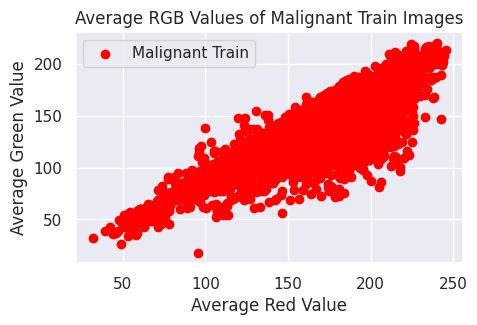

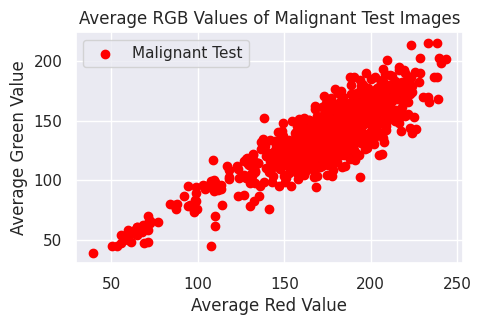

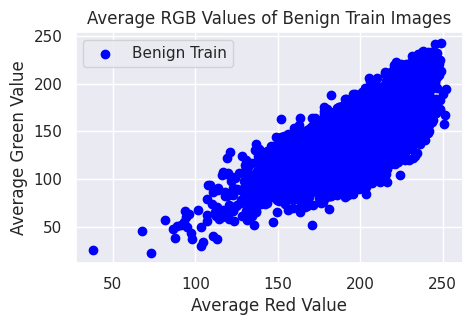

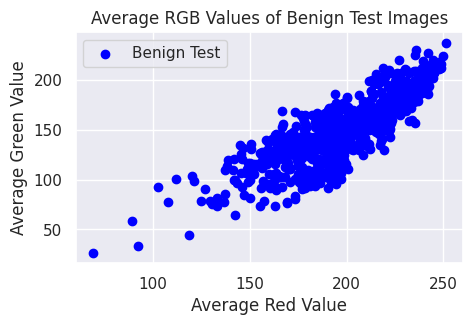

In [8]:
def calc_avg_rgb(images):
    # initialize lists to store average RGB values
    avg_red_values = []
    avg_green_values = []
    avg_blue_values = []

    # calculate average RGB values for each image
    for image in images:
        # calculate average RGB values for the current image
        avg_red = np.mean(image[:, :, 0])  # red channel
        avg_green = np.mean(image[:, :, 1])  # green channel
        avg_blue = np.mean(image[:, :, 2])  # blue channel

        # append average RGB values to the respective lists
        avg_red_values.append(avg_red)
        avg_green_values.append(avg_green)
        avg_blue_values.append(avg_blue)

    return avg_red_values, avg_green_values, avg_blue_values

# calculate average RGB values for malignant images
mal_train_avg_red, mal_train_avg_green, mal_train_avg_blue = calc_avg_rgb(mal_train_img_resized)
mal_test_avg_red, mal_test_avg_green, mal_test_avg_blue = calc_avg_rgb(mal_test_img_resized)

# calculate average RGB values for benign images
ben_train_avg_red, ben_train_avg_green, ben_train_avg_blue = calc_avg_rgb(ben_train_img_resized)
ben_test_avg_red, ben_test_avg_green, ben_test_avg_blue = calc_avg_rgb(ben_test_img_resized)

# plot a graph for malignant train images
plt.figure(figsize=(5, 3))
plt.scatter(mal_train_avg_red, mal_train_avg_green, color='red', label='Malignant Train')
plt.title('Average RGB Values of Malignant Train Images')
plt.xlabel('Average Red Value')
plt.ylabel('Average Green Value')
plt.legend()
plt.grid(True)
plt.show()

# plot a graph for malignant test images
plt.figure(figsize=(5, 3))
plt.scatter(mal_test_avg_red, mal_test_avg_green, color='red', label='Malignant Test')
plt.title('Average RGB Values of Malignant Test Images')
plt.xlabel('Average Red Value')
plt.ylabel('Average Green Value')
plt.legend()
plt.grid(True)
plt.show()

# Plot a graph for benign train images
plt.figure(figsize=(5, 3))
plt.scatter(ben_train_avg_red, ben_train_avg_green, color='blue', label='Benign Train')
plt.title('Average RGB Values of Benign Train Images')
plt.xlabel('Average Red Value')
plt.ylabel('Average Green Value')
plt.legend()
plt.grid(True)
plt.show()

# Plot a graph for benign test images
plt.figure(figsize=(5, 3))
plt.scatter(ben_test_avg_red, ben_test_avg_green, color='blue', label='Benign Test')
plt.title('Average RGB Values of Benign Test Images')
plt.xlabel('Average Red Value')
plt.ylabel('Average Green Value')
plt.legend()
plt.grid(True)
plt.show()

2.2 Number of images in each dataset with RGB values greater than 250 or less than 5

In [9]:
# malignant images (train)
mal_train_outliers = np.sum((np.array(mal_train_avg_red) > 250) | (np.array(mal_train_avg_green) > 250) | (np.array(mal_train_avg_blue) > 250) |
                            (np.array(mal_train_avg_red) < 5) | (np.array(mal_train_avg_green) < 5) | (np.array(mal_train_avg_blue) < 5))
print("Number of outliers in the Malignant train dataset:", mal_train_outliers)

# malignant images (test)
mal_test_outliers = np.sum((np.array(mal_test_avg_red) > 250) | (np.array(mal_test_avg_green) > 250) | (np.array(mal_test_avg_blue) > 250) |
                           (np.array(mal_test_avg_red) < 5) | (np.array(mal_test_avg_green) < 5) | (np.array(mal_test_avg_blue) < 5))
print("Number of outliers in the Malignant test dataset:", mal_test_outliers)

# benign images (train)
ben_train_outliers = np.sum((np.array(ben_train_avg_red) > 250) | (np.array(ben_train_avg_green) > 250) | (np.array(ben_train_avg_blue) > 250) |
                            (np.array(ben_train_avg_red) < 5) | (np.array(ben_train_avg_green) < 5) | (np.array(ben_train_avg_blue) < 5))
print("\nNumber of outliers in the Benign train dataset:", ben_train_outliers)

# benign images (test)
ben_test_outliers = np.sum((np.array(ben_test_avg_red) > 250) | (np.array(ben_test_avg_green) > 250) | (np.array(ben_test_avg_blue) > 250) |
                           (np.array(ben_test_avg_red) < 5) | (np.array(ben_test_avg_green) < 5) | (np.array(ben_test_avg_blue) < 5))
print("Number of outliers in the Benign test dataset:", ben_test_outliers)

Number of outliers in the Malignant train dataset: 0
Number of outliers in the Malignant test dataset: 0

Number of outliers in the Benign train dataset: 5
Number of outliers in the Benign test dataset: 1


2.3 Displaying images with rgb outliers

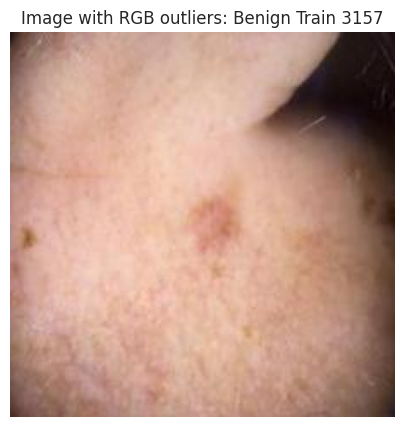

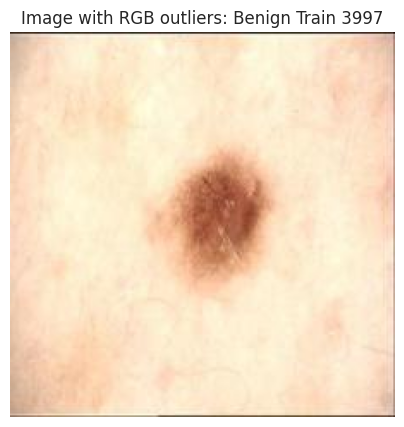

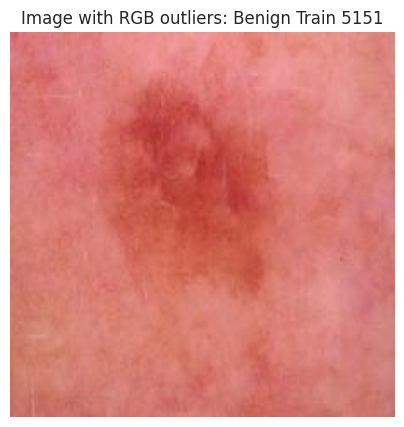

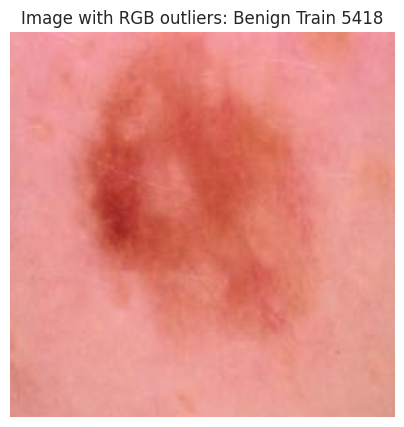

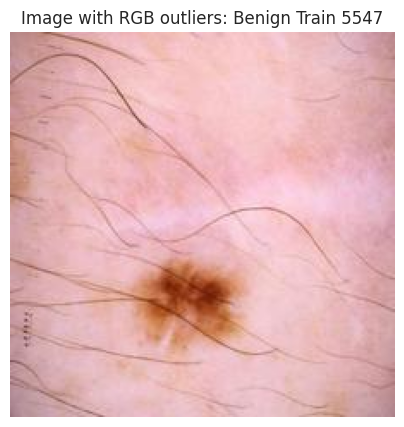

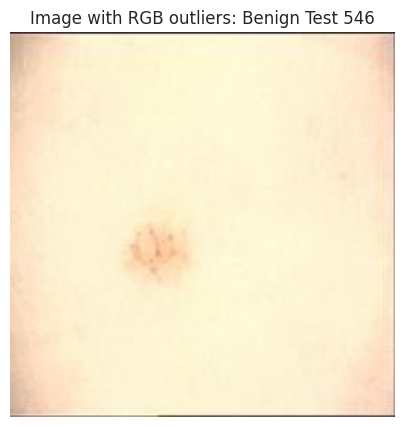

In [10]:
def display_outliers(images, avg_red_values, avg_green_values, avg_blue_values, folder):
    outlier_indices = np.where((np.array(avg_red_values) > 250) | (np.array(avg_green_values) > 250) | (np.array(avg_blue_values) > 250) |
                               (np.array(avg_red_values) < 5) | (np.array(avg_green_values) < 5) | (np.array(avg_blue_values) < 5))[0]

    for i in outlier_indices:
        plt.figure(figsize=(5, 5))
        plt.imshow(images[i])
        plt.title(f"Image with RGB outliers: {folder} {i+1}")
        plt.axis('off')
        plt.show()

display_outliers(ben_train_img, ben_train_avg_red, ben_train_avg_green, ben_train_avg_blue, "Benign Train")
display_outliers(ben_test_img, ben_test_avg_red, ben_test_avg_green, ben_test_avg_blue, "Benign Test")

### <font color="yellow"> 3. Normalize Pixel Values </font>


3.1  Average pixel values

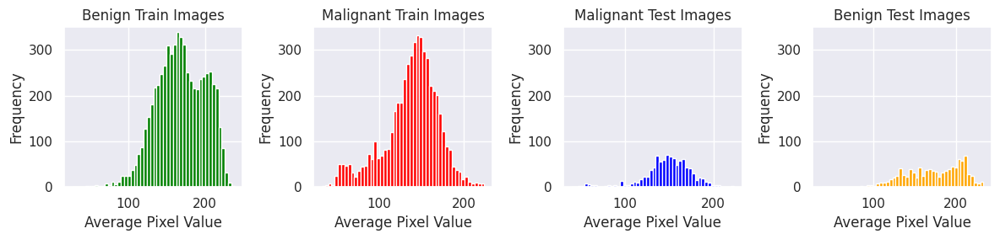

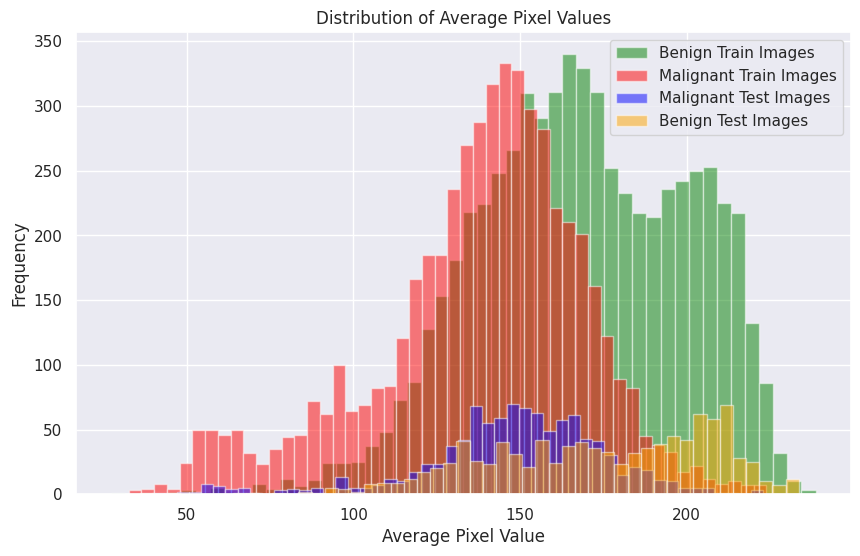

In [11]:
# Calculate the average value of all pixels in each image per data set
avg_pix_mal_train = [np.mean(img) for img in mal_train_img_resized]
avg_pix_mal_test = [np.mean(img) for img in mal_test_img_resized]
avg_pix_ben_train = [np.mean(img) for img in ben_train_img_resized]
avg_pix_ben_test = [np.mean(img) for img in ben_test_img_resized]

fig, axs = plt.subplots(1, 4, figsize=(12, 3))  # 1 row, 4 columns

# Histogramm für Benign Train Images
axs[0].hist(avg_pix_ben_train, bins=50, color='green', alpha=1)
axs[0].set_title('Benign Train Images')
axs[0].set_xlabel('Average Pixel Value')
axs[0].set_ylabel('Frequency')
axs[0].set_ylim(0, 350)

# Histogramm für Malignant Train Images
axs[1].hist(avg_pix_mal_train, bins=50, color='red', alpha=1)
axs[1].set_title('Malignant Train Images')
axs[1].set_xlabel('Average Pixel Value')
axs[1].set_ylabel('Frequency')
axs[1].set_ylim(0, 350)

# Histogramm für Malignant Test Images
axs[2].hist(avg_pix_mal_test, bins=50, color='blue', alpha=1)
axs[2].set_title('Malignant Test Images')
axs[2].set_xlabel('Average Pixel Value')
axs[2].set_ylabel('Frequency')
axs[2].set_ylim(0, 350)

# Histogramm für Benign Test Images
axs[3].hist(avg_pix_ben_test, bins=50, color='orange', alpha=1)
axs[3].set_title('Benign Test Images')
axs[3].set_xlabel('Average Pixel Value')
axs[3].set_ylabel('Frequency')
axs[3].set_ylim(0, 350)

# Anzeigen der Plots
plt.tight_layout()  # Passt die Layouts an, um Überlappungen zu verhindern
plt.show()

# plot histogram of average pixel values
plt.figure(figsize=(10, 6))
plt.hist(avg_pix_ben_train, bins=50, color='green', alpha=0.5, label='Benign Train Images')
plt.hist(avg_pix_mal_train, bins=50, color='red', alpha=0.5, label='Malignant Train Images')
plt.hist(avg_pix_mal_test, bins=50, color='blue', alpha=0.5, label='Malignant Test Images')
plt.hist(avg_pix_ben_test, bins=50, color='orange', alpha=0.5, label='Benign Test Images')
plt.xlabel('Average Pixel Value')
plt.ylabel('Frequency')
plt.title('Distribution of Average Pixel Values')
plt.legend()
plt.grid(True)
plt.show()


### <font color="yellow"> 4. Data Augmentation </font>

4.1 Data augmentation (data set sizes * 4)

In [12]:
%pip install torch
import torch
%pip install torchvision
from torchvision import transforms
from torchvision.datasets import ImageFolder
from PIL import ImageFilter
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
  Using cached nvidia_nvjitlink_cu12-12.4.127-py3-none-m

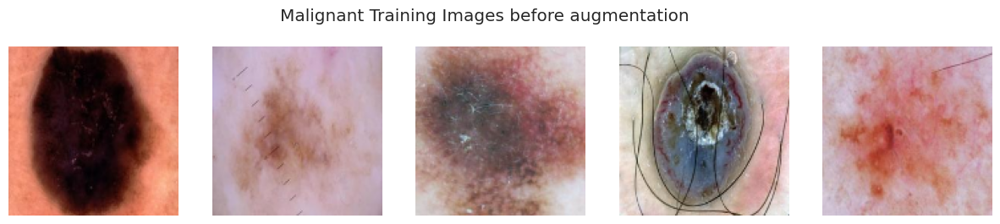

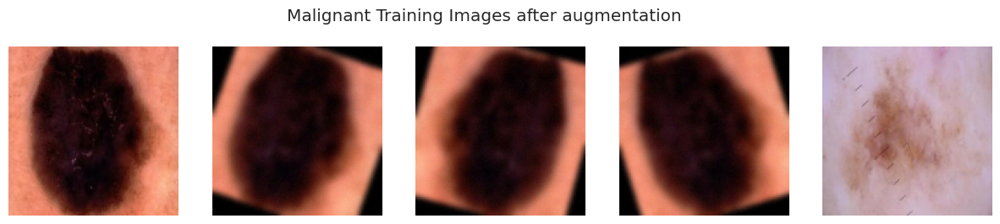

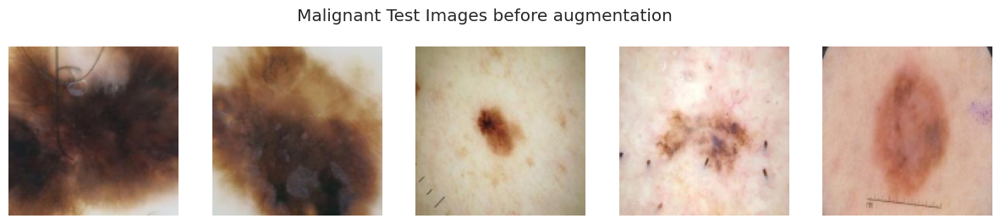

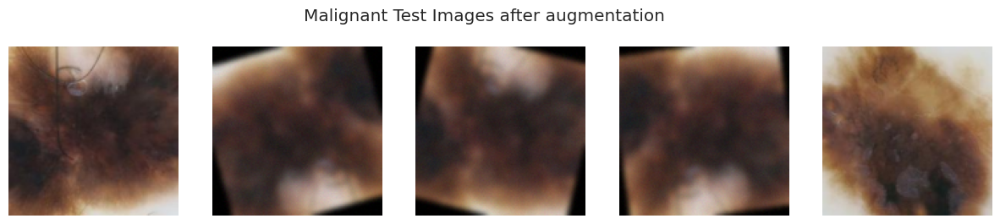

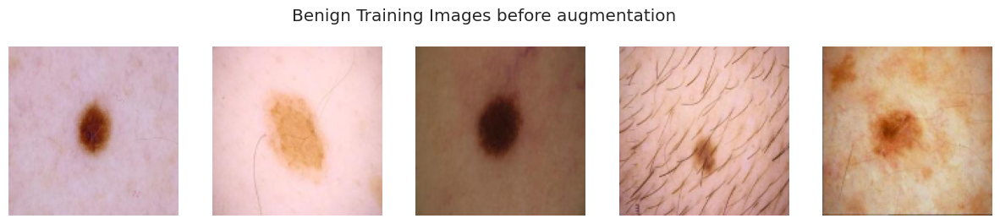

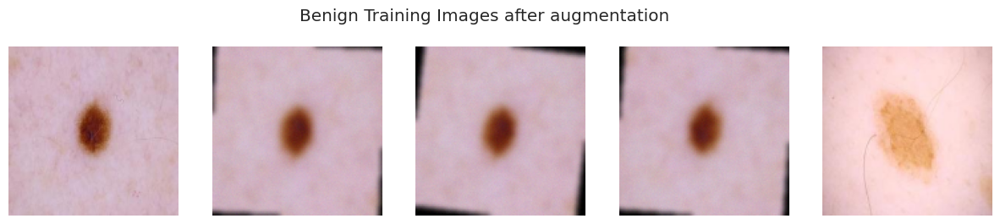

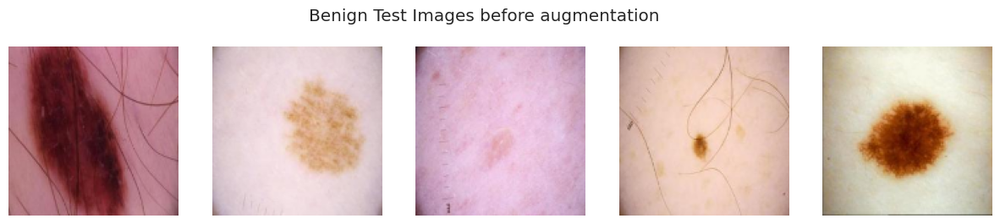

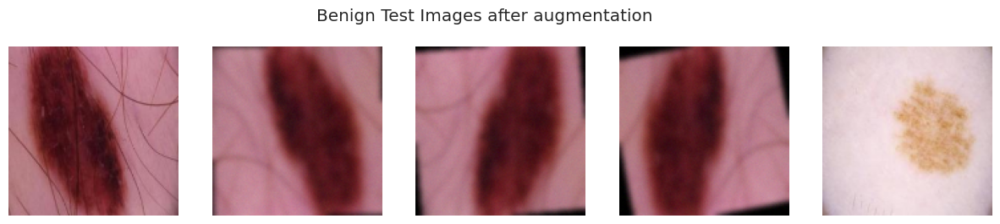

In [13]:
'''Plotting images before '''
def plot_images(dataset, title):
    plt.figure(figsize=(15, 3))  # Breite, Höhe in Zoll für die gesamte Zeile
    plt.suptitle(title)  # Titel über den Bildern setzen
    for i in range(5):  # Zeige die ersten 5 Bilder des Datensatzes an
        ax = plt.subplot(1, 5, i + 1)  # 1 Reihe, 5 Spalten, Index i+1 für den aktuellen Plot
        img = dataset[i]  # Greife auf jedes Bild im Datensatz zu
        img = np.clip(img, 0, 255)  # Stelle sicher, dass die Bildwerte im Bereich [0, 255] liegen
        plt.imshow(img.astype('uint8'))  # Plotte das Bild, konvertiere zu uint8, falls notwendig
        plt.axis('off')  # Verstecke die Achsen
    plt.show()


''' Data Augmentation'''
class CustomTransform:
    def __call__(self, image):
        # Apply Gaussian blur
        image = image.filter(ImageFilter.GaussianBlur(2))

        # Convert image to numpy array for noise addition
        np_image = np.array(image) / 255.0  # Normalize here for noise processing
        noise = np.random.normal(0, 0.01, np_image.shape)
        np_image = np.clip(np_image + noise, 0, 1)

        # Convert back to PIL image
        return Image.fromarray((np_image * 255).astype('uint8'))

# Transformation pipeline
# Transformation pipeline
augment_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.RandomVerticalFlip(),    # Random vertical flip
    transforms.RandomRotation(20),      # Random rotation up to 20 degrees
    CustomTransform(),                  # Custom transformation for blurring and noise
    transforms.ToTensor()               # Convert images to PyTorch tensors
])

def apply_transforms(dataset, num_augmentations=3):
    augmented_images = []
    for img in dataset:
        # Convert the NumPy array to a PIL image if not already one
        if isinstance(img, np.ndarray):
            img = Image.fromarray(img.astype('uint8'))
        original_img = transforms.ToTensor()(img)  # Convert original image to tensor
        augmented_images.append(original_img)  # Add original image to the list
        for _ in range(num_augmentations):
            # Apply the transformation
            transformed_img = augment_transform(img)
            augmented_images.append(transformed_img)  # Add transformed image to the list
    return augmented_images

'''Plotting images after '''
def plot_images_after(dataset, title):
    plt.figure(figsize=(15, 3))  # Width, Height in inches for the whole row
    plt.suptitle(title)
    for i in range(5):  # Display the first 5 images of the dataset
        ax = plt.subplot(1, 5, i + 1)  # 1 row, 5 columns, i+1 index for current plot
        img = dataset[i].detach().numpy()  # Ensure detachment and convert to numpy
        img = np.clip(img, 0, 1)  # Ensure image values are within [0, 1] range
        img = img.transpose(1, 2, 0)  # Reorder dimensions for plotting
        plt.imshow(img)
        plt.axis('off')  # Hide the axes
    plt.show()

# Hier ist, wie Sie die Funktion aufrufen würden:
plot_images(mal_train_img_resized[:5], "Malignant Training Images before augmentation")
mal_train_transformed = apply_transforms(mal_train_img_resized)
plot_images_after(mal_train_transformed[:5], "Malignant Training Images after augmentation")

plot_images(mal_test_img_resized[:5], "Malignant Test Images before augmentation")
mal_test_transformed = apply_transforms(mal_test_img_resized)
plot_images_after(mal_test_transformed[:5], "Malignant Test Images after augmentation")

plot_images(ben_train_img_resized[:5], "Benign Training Images before augmentation")
ben_train_transformed = apply_transforms(ben_train_img_resized)
plot_images_after(ben_train_transformed[:5], "Benign Training Images after augmentation")

plot_images(ben_test_img_resized[:5], "Benign Test Images before augmentation")
ben_test_transformed = apply_transforms(ben_test_img_resized)
plot_images_after(ben_test_transformed[:5], "Benign Test Images after augmentation")

In [14]:
# Malignant images
mal_train_augmented_length = len(mal_train_transformed)
mal_test_augmented_length = len(mal_test_transformed)
print("Number of malignant images (train):", mal_train_augmented_length)
print("Number of malignant images (test):", mal_test_augmented_length)

# Benign images
ben_train_augmented_length = len(ben_train_transformed)
ben_test_augmented_length = len(ben_test_transformed)
print("Number of benign images (train):", ben_train_augmented_length)
print("Number of benign images (test):", ben_test_augmented_length)

Number of malignant images (train): 20984
Number of malignant images (test): 3992
Number of benign images (train): 25156
Number of benign images (test): 4000


### <font color="yellow"> 5. Balancing the Sizes within each Class </font>


In [15]:
import random

def balance_classes(dataset1, dataset2):
    min_size = min(len(dataset1), len(dataset2))

    dataset1_balanced = random.sample(dataset1, min_size)
    dataset2_balanced = random.sample(dataset2, min_size)

    return dataset1_balanced, dataset2_balanced

mal_train_transformed, ben_train_transformed = balance_classes(mal_train_transformed, ben_train_transformed)
mal_test_transformed, ben_test_transformed = balance_classes(mal_test_transformed, ben_test_transformed)

# Malignant images
mal_train_augmented_length = len(mal_train_transformed)
mal_test_augmented_length = len(mal_test_transformed)
print("Number of malignant images (train):", mal_train_augmented_length)
print("Number of malignant images (test):", mal_test_augmented_length)

# Benign images
ben_train_augmented_length = len(ben_train_transformed)
ben_test_augmented_length = len(ben_test_transformed)
print("Number of benign images (train):", ben_train_augmented_length)
print("Number of benign images (test):", ben_test_augmented_length)

Number of malignant images (train): 20984
Number of malignant images (test): 3992
Number of benign images (train): 20984
Number of benign images (test): 3992


### <font color="yellow"> 6. Add Black Border </font>


6.1 Black Border

In [16]:
from PIL import Image, ImageDraw
import numpy as np
import torch

def mask_image_to_smaller_circle_for_dataset(images):
    result_images = []
    for tensor_image in images:
        # Convert tensor to numpy array and ensure it's in uint8 format
        image = tensor_image.permute(1, 2, 0).cpu().numpy()  # Change from CxHxW to HxWxC
        image = (image * 255).astype(np.uint8)  # Assuming the images were normalized to [0,1]

        # Convert numpy array to PIL Image
        img = Image.fromarray(image)
        w, h = img.size

        # Create a mask to cover the image with an ellipse
        mask = Image.new('L', (w, h), 0)
        draw = ImageDraw.Draw(mask)
        center_x, center_y = w // 2, h // 2
        radius = int(min(center_x, center_y) * 0.8)

        draw.ellipse((center_x - radius, center_y - radius, center_x + radius, center_y + radius), fill=255)

        # Apply the mask to the original image
        result = Image.composite(img, Image.new('RGB', (w, h)), mask)

        # Convert the result back to a numpy array
        result_images.append(np.array(result))

    return result_images

# Now apply the function to the transformed datasets
mal_train_final = mask_image_to_smaller_circle_for_dataset(mal_train_transformed)
mal_test_final = mask_image_to_smaller_circle_for_dataset(mal_test_transformed)
ben_train_final = mask_image_to_smaller_circle_for_dataset(ben_train_transformed)
ben_test_final = mask_image_to_smaller_circle_for_dataset(ben_test_transformed)

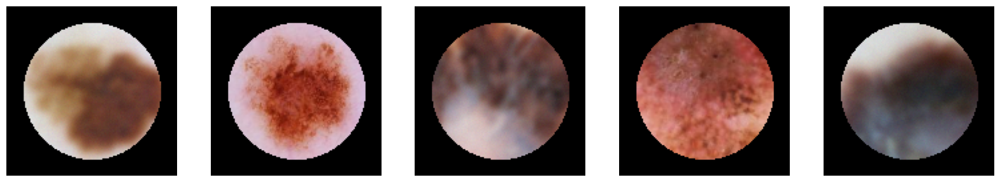

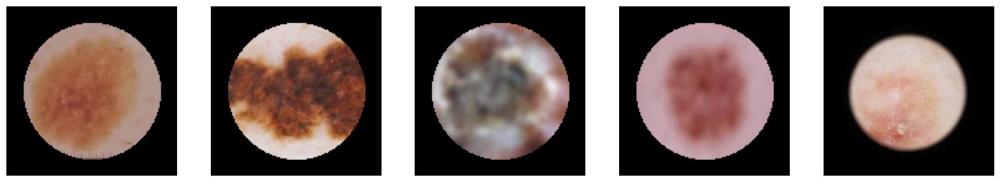

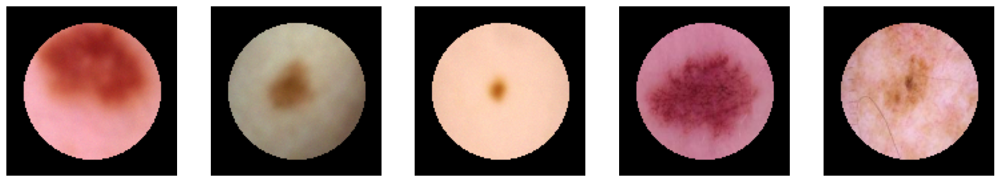

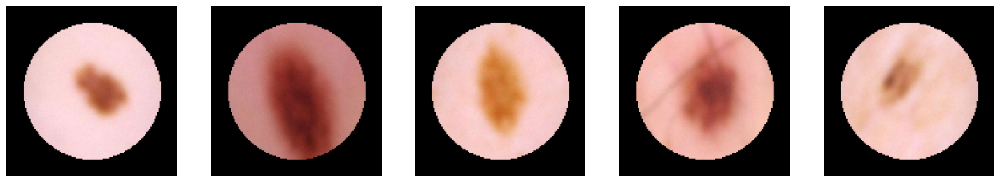

In [17]:
import matplotlib.pyplot as plt

def plot_single_row(images, num_images=5, figsize=(20, 4)):
    plt.figure(figsize=figsize)
    for i in range(min(len(images), num_images)):  # Display up to num_images or the number of available images
        plt.subplot(1, num_images, i + 1)  # 1 row, num_images columns, position i+1
        plt.imshow(images[i])
        plt.axis('off')
    plt.show()

# Now call the function with your final dataset
plot_single_row(mal_train_final)
plot_single_row(mal_test_final)
plot_single_row(ben_train_final)
plot_single_row(ben_test_final)

### <font color="yellow"> 7. Pixel Value Normalization </font>

In [18]:
# pixel normalization
mal_train_final_final = [img / 255.0 for img in mal_train_final]
mal_test_final_final = [img / 255.0 for img in mal_test_final]
ben_train_final_final = [img / 255.0 for img in ben_train_final]
ben_test_final_final = [img / 255.0 for img in ben_test_final]

In [19]:
# check if pixel values are normalized
mal_train_normalized = all(np.max(img) <= 1.0 for img in mal_train_final_final)
print("Are pixel values normalized for malignant train images?", mal_train_normalized)

mal_test_normalized = all(np.max(img) <= 1.0 for img in mal_test_final_final)
print("Are pixel values normalized for malignant test images?", mal_test_normalized)

ben_train_normalized = all(np.max(img) <= 1.0 for img in ben_train_final_final)
print("Are pixel values normalized for benign train images?", ben_train_normalized)

ben_test_normalized = all(np.max(img) <= 1.0 for img in ben_test_final_final)
print("Are pixel values normalized for benign test images?", ben_test_normalized)

Are pixel values normalized for malignant train images? True
Are pixel values normalized for malignant test images? True
Are pixel values normalized for benign train images? True
Are pixel values normalized for benign test images? True


## <font color="yellow"> Algorithms</font>

### <font color="yellow"> 1. Random Forest </font>

In [28]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Function to flatten image data
def flatten_images(images):
    return np.array([img.ravel() for img in images])

# Flatten the image datasets
X_train_mal_flat = flatten_images(mal_train_final)
X_test_mal_flat = flatten_images(mal_test_final)
X_train_ben_flat = flatten_images(ben_train_final)
X_test_ben_flat = flatten_images(ben_test_final)

# Combine the datasets
X_train_flat = np.vstack((X_train_mal_flat, X_train_ben_flat))
X_test_flat = np.vstack((X_test_mal_flat, X_test_ben_flat))

# Create labels: '1' for malignant, '0' for benign
y_train = np.array([1] * len(X_train_mal_flat) + [0] * len(X_train_ben_flat))
y_test = np.array([1] * len(X_test_mal_flat) + [0] * len(X_test_ben_flat))

# Initialize and train the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_flat, y_train)

# Predict on the test set
y_pred = rf_classifier.predict(X_test_flat)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Print the results
print("Accuracy of the Random Forest model:", accuracy)
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Accuracy of the Random Forest model: 0.8876503006012024
Confusion Matrix:
[[3513  479]
 [ 418 3574]]
Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.88      0.89      3992
           1       0.88      0.90      0.89      3992

    accuracy                           0.89      7984
   macro avg       0.89      0.89      0.89      7984
weighted avg       0.89      0.89      0.89      7984



### <font color="yellow"> 2. SVC</font>

In [ ]:
import numpy as np
from sklearn.svm import SVC  # Support Vector Classifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

# Create labels for the datasets
mal_labels_train = np.ones(len(mal_train_final))  # Create an array of 1s for malignant
ben_labels_train = np.zeros(len(ben_train_final)) # Create an array of 0s for benign

mal_labels_test = np.ones(len(mal_test_final))   # Create an array of 1s for malignant
ben_labels_test = np.zeros(len(ben_test_final))  # Create an array of 0s for benign

# Combine the datasets
X_train = np.concatenate((mal_train_final, ben_train_final), axis=0)
y_train = np.concatenate((mal_labels_train, ben_labels_train), axis=0)

X_test = np.concatenate((mal_test_final, ben_test_final), axis=0)
y_test = np.concatenate((mal_labels_test, ben_labels_test), axis=0)

# Shuffle the data and labels together to ensure random distribution (important for training)
train_shuffle_indices = np.random.permutation(len(X_train))
test_shuffle_indices = np.random.permutation(len(X_test))

X_train, y_train = X_train[train_shuffle_indices], y_train[train_shuffle_indices]
X_test, y_test = X_test[test_shuffle_indices], y_test[test_shuffle_indices]

X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Now X_train, X_test, y_train, and y_test are ready to be used for SVM training
# Initialize the SVM classifier
model = SVC(kernel='rbf', gamma='scale')

# Train the model using the flattened data
model.fit(X_train_flat, y_train)

# Predict on the flattened test data
y_pred = model.predict(X_test_flat)

# evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Print out the accuracy and a detailed classification report
print("Accuracy of the Support Vector Classifier:", accuracy)
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(classification_report(y_test, y_pred))

### <font color="yellow"> 3. LNN</font>

In [20]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix

num_classes = 2  # For binary classification

# Combining datasets and labels
X_train = np.concatenate([mal_train_final, ben_train_final])
X_test = np.concatenate([mal_test_final, ben_test_final])

# Creating labels
y_train = np.array([1] * len(mal_train_final) + [0] * len(ben_train_final))
y_test = np.array([1] * len(mal_test_final) + [0] * len(ben_test_final))

# Convert labels to categorical format
y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)

# Building a linear model (equivalent to logistic regression)
model = Sequential([
    Flatten(input_shape=(X_train.shape[1], X_train.shape[2], 3)),
    Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.2)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

# Predict the labels
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# Generate confusion matrix and classification report
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)
class_report = classification_report(y_true_labels, y_pred_labels)

print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


Epoch 1/10
1050/1050 [==============================] - 6s 4ms/step - loss: 238.7862 - accuracy: 0.6261 - val_loss: 10.3004 - val_accuracy: 0.9671
Epoch 2/10
1050/1050 [==============================] - 3s 3ms/step - loss: 160.1883 - accuracy: 0.6516 - val_loss: 0.8434 - val_accuracy: 0.9954
Epoch 3/10
1050/1050 [==============================] - 3s 3ms/step - loss: 175.4917 - accuracy: 0.6593 - val_loss: 11.7697 - val_accuracy: 0.9600
Epoch 4/10
1050/1050 [==============================] - 3s 3ms/step - loss: 178.8047 - accuracy: 0.6554 - val_loss: 2434.5784 - val_accuracy: 8.3393e-04
Epoch 5/10
1050/1050 [==============================] - 3s 3ms/step - loss: 188.8719 - accuracy: 0.6622 - val_loss: 50.2347 - val_accuracy: 0.8139
Epoch 6/10
1050/1050 [==============================] - 3s 3ms/step - loss: 191.4546 - accuracy: 0.6596 - val_loss: 384.4411 - val_accuracy: 0.2634
Epoch 7/10
1050/1050 [==============================] - 3s 3ms/step - loss: 163.4239 - accuracy: 0.6677 - val_lo

### <font color="yellow"> 4. CNN 1 </font>

In [24]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix

# Assuming you have a way to get labels aligned with your images
# For example, creating a binary classification, 0 for benign and 1 for malignant
num_classes = 2

# Combine datasets and labels
X_train = np.concatenate([mal_train_final, ben_train_final])
X_test = np.concatenate([mal_test_final, ben_test_final])

# Create labels (assuming binary classification: 0 for benign, 1 for malignant)
y_train = np.array([1] * len(mal_train_final) + [0] * len(ben_train_final))
y_test = np.array([1] * len(mal_test_final) + [0] * len(ben_test_final))

# Convert labels to categorical
y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)

# Build the model
model = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, batch_size=32, epochs=10, validation_split=0.2)

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

# Predict the labels
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# Generate confusion matrix and classification report
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)
class_report = classification_report(y_true_labels, y_pred_labels)

print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


Epoch 1/10
1050/1050 [==============================] - 15s 12ms/step - loss: 17.5749 - accuracy: 0.7394 - val_loss: 0.8049 - val_accuracy: 0.7383
Epoch 2/10
1050/1050 [==============================] - 12s 12ms/step - loss: 0.6535 - accuracy: 0.7813 - val_loss: 0.3311 - val_accuracy: 0.8601
Epoch 3/10
1050/1050 [==============================] - 12s 12ms/step - loss: 0.5016 - accuracy: 0.7971 - val_loss: 1.2855 - val_accuracy: 0.4888
Epoch 4/10
1050/1050 [==============================] - 12s 12ms/step - loss: 0.4599 - accuracy: 0.8017 - val_loss: 0.9113 - val_accuracy: 0.6247
Epoch 5/10
1050/1050 [==============================] - 12s 12ms/step - loss: 0.4430 - accuracy: 0.8092 - val_loss: 0.6719 - val_accuracy: 0.7001
Epoch 6/10
1050/1050 [==============================] - 12s 11ms/step - loss: 0.4320 - accuracy: 0.8126 - val_loss: 0.4467 - val_accuracy: 0.7987
Epoch 7/10
1050/1050 [==============================] - 12s 12ms/step - loss: 0.4183 - accuracy: 0.8180 - val_loss: 0.6762 

### <font color="yellow"> 5. CNN 2</font>
Finetuned with early stopping

In [20]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix

# Assuming you have a way to get labels aligned with your images
# For example, creating a binary classification, 0 for benign and 1 for malignant
num_classes = 2

# Combine datasets and labels
X_train = np.concatenate([mal_train_final, ben_train_final])
X_test = np.concatenate([mal_test_final, ben_test_final])

# Create labels (assuming binary classification: 0 for benign, 1 for malignant)
y_train = np.array([1] * len(mal_train_final) + [0] * len(ben_train_final))
y_test = np.array([1] * len(mal_test_final) + [0] * len(ben_test_final))

# Convert labels to categorical
y_train = to_categorical(y_train, num_classes)
y_test = to_categorical(y_test, num_classes)

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Build the model with added Dropout layers for regularization
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(X_train.shape[1], X_train.shape[2], 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),
    Conv2D(16, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='sigmoid')
])

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

# Setup Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with data augmentation
model.fit(datagen.flow(X_train, y_train, batch_size=32),
          steps_per_epoch=len(X_train) / 32,  # number of batches per epoch
          epochs=20,
          validation_data=(X_test, y_test),
          callbacks=[early_stopping])

# Evaluate the model
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

# Predict the labels
y_pred = model.predict(X_test)
y_pred_labels = np.argmax(y_pred, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

# Generate confusion matrix and classification report
conf_matrix = confusion_matrix(y_true_labels, y_pred_labels)
class_report = classification_report(y_true_labels, y_pred_labels)

print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


Epoch 1/20
1311/1311 [==============================] - 155s 114ms/step - loss: 0.9282 - accuracy: 0.5887 - val_loss: 0.6367 - val_accuracy: 0.6390
Epoch 2/20
1311/1311 [==============================] - 149s 114ms/step - loss: 0.5828 - accuracy: 0.6940 - val_loss: 0.6115 - val_accuracy: 0.6606
Epoch 3/20
1311/1311 [==============================] - 148s 113ms/step - loss: 0.5433 - accuracy: 0.7297 - val_loss: 0.4667 - val_accuracy: 0.7928
Epoch 4/20
1311/1311 [==============================] - 149s 113ms/step - loss: 0.4569 - accuracy: 0.7830 - val_loss: 0.4076 - val_accuracy: 0.8265
Epoch 5/20
1311/1311 [==============================] - 149s 114ms/step - loss: 0.4218 - accuracy: 0.8031 - val_loss: 0.5458 - val_accuracy: 0.7357
Epoch 6/20
1311/1311 [==============================] - 148s 113ms/step - loss: 0.4044 - accuracy: 0.8162 - val_loss: 0.4103 - val_accuracy: 0.8201
Epoch 7/20
1311/1311 [==============================] - 150s 114ms/step - loss: 0.3902 - accuracy: 0.8228 - val_

## <font color="yellow"> Ensembles</font>